In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet")
import dense_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'dense_unet_30ep_512_fG_wo_decay'
INPUT_SHAPE = (512, 512, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/history/" + FILE_NAME + '_history' ".json"

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-01-30 15:25:04.315573: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 15:25:04.315603: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 15:25:04.316697: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-30 15:25:04.322115: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-30 15:25:04.905202: W tensorflow/compiler/tf2

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_general()
test_preproc = preprocess.build_augmentation_for_general(is_train=False)

# Create train, test generator
train_generator = data_generator.FullSizedDataGenerator(
    TRAIN_SOURCE,
    batch_size= 4,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.FullSizedDataGenerator(
    TRAIN_SOURCE,
    batch_size= 4,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = dense_unet.build_model(input_shape=INPUT_SHAPE)
model.summary()

2024-01-30 14:26:09.713760: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 14:26:09.747705: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 14:26:09.747914: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 48)         480       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 512, 512, 48)         192       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 512, 512, 48)         0         ['batch_normalization[0][0

In [3]:
train.model_train(model,
                 30,
                 train_generator,
                 test_generator, 
                 MODEL_PATH,
                 HISTORY_PATH,
                 save_every_epoch = True,
                 apply_weight_decay = False)

Epoch 1/30


2024-01-30 14:26:22.799902: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-30 14:26:25.557181: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-01-30 14:26:25.557218: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-01-30 14:26:25.557232: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 736.00MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there co

220/220 [==============================] - ETA: 0s - loss: 0.3489 - sensitivity: 0.6550 - specificity: 0.9556 - accuracy: 0.9347INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/1--0.3489-0.6550-0.9556-0.0744-0.9991.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/1--0.3489-0.6550-0.9556-0.0744-0.9991.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/1--0.3489-0.6550-0.9556-0.0744-0.9991.pb
220/220 [==============================] - 131s 514ms/step - loss: 0.3489 - sensitivity: 0.6550 - specificity: 0.9556 - accuracy: 0.9347 - val_loss: 0.7424 - val_sensitivity: 0.0744 - val_specificity: 0.9991 - val_accuracy: 0.9339
Epoch 2/30
220/220 [==============================] - ETA: 0s - loss: 0.2390 - sensitivity: 0.7346 - specificity: 0.9788 - accuracy: 0.9619INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/2--0.2390-0.7346-0.9788-0.5804-0.9889.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/2--0.2390-0.7346-0.9788-0.5804-0.9889.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/2--0.2390-0.7346-0.9788-0.5804-0.9889.pb
220/220 [==============================] - 112s 507ms/step - loss: 0.2390 - sensitivity: 0.7346 - specificity: 0.9788 - accuracy: 0.9619 - val_loss: 0.3751 - val_sensitivity: 0.5804 - val_specificity: 0.9889 - val_accuracy: 0.9603
Epoch 3/30
220/220 [==============================] - ETA: 0s - loss: 0.2203 - sensitivity: 0.7595 - specificity: 0.9800 - accuracy: 0.9648INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/3--0.2203-0.7595-0.9800-0.7565-0.9813.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/3--0.2203-0.7595-0.9800-0.7565-0.9813.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/3--0.2203-0.7595-0.9800-0.7565-0.9813.pb
220/220 [==============================] - 113s 513ms/step - loss: 0.2203 - sensitivity: 0.7595 - specificity: 0.9800 - accuracy: 0.9648 - val_loss: 0.2149 - val_sensitivity: 0.7565 - val_specificity: 0.9813 - val_accuracy: 0.9656
Epoch 4/30
220/220 [==============================] - ETA: 0s - loss: 0.2109 - sensitivity: 0.7712 - specificity: 0.9806 - accuracy: 0.9662INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/4--0.2109-0.7712-0.9806-0.7389-0.9845.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/4--0.2109-0.7712-0.9806-0.7389-0.9845.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/4--0.2109-0.7712-0.9806-0.7389-0.9845.pb
220/220 [==============================] - 113s 512ms/step - loss: 0.2109 - sensitivity: 0.7712 - specificity: 0.9806 - accuracy: 0.9662 - val_loss: 0.2096 - val_sensitivity: 0.7389 - val_specificity: 0.9845 - val_accuracy: 0.9673
Epoch 5/30
220/220 [==============================] - ETA: 0s - loss: 0.2050 - sensitivity: 0.7783 - specificity: 0.9811 - accuracy: 0.9671INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/5--0.2050-0.7783-0.9811-0.7507-0.9847.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/5--0.2050-0.7783-0.9811-0.7507-0.9847.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/5--0.2050-0.7783-0.9811-0.7507-0.9847.pb
220/220 [==============================] - 112s 510ms/step - loss: 0.2050 - sensitivity: 0.7783 - specificity: 0.9811 - accuracy: 0.9671 - val_loss: 0.2023 - val_sensitivity: 0.7507 - val_specificity: 0.9847 - val_accuracy: 0.9683
Epoch 6/30
220/220 [==============================] - ETA: 0s - loss: 0.1999 - sensitivity: 0.7839 - specificity: 0.9815 - accuracy: 0.9679INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/6--0.1999-0.7839-0.9815-0.8028-0.9796.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/6--0.1999-0.7839-0.9815-0.8028-0.9796.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/6--0.1999-0.7839-0.9815-0.8028-0.9796.pb
220/220 [==============================] - 111s 507ms/step - loss: 0.1999 - sensitivity: 0.7839 - specificity: 0.9815 - accuracy: 0.9679 - val_loss: 0.1963 - val_sensitivity: 0.8028 - val_specificity: 0.9796 - val_accuracy: 0.9672
Epoch 7/30
220/220 [==============================] - ETA: 0s - loss: 0.1973 - sensitivity: 0.7857 - specificity: 0.9819 - accuracy: 0.9683INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/7--0.1973-0.7857-0.9819-0.7782-0.9831.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/7--0.1973-0.7857-0.9819-0.7782-0.9831.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/7--0.1973-0.7857-0.9819-0.7782-0.9831.pb
220/220 [==============================] - 115s 521ms/step - loss: 0.1973 - sensitivity: 0.7857 - specificity: 0.9819 - accuracy: 0.9683 - val_loss: 0.1937 - val_sensitivity: 0.7782 - val_specificity: 0.9831 - val_accuracy: 0.9688
Epoch 8/30
220/220 [==============================] - ETA: 0s - loss: 0.1932 - sensitivity: 0.7894 - specificity: 0.9823 - accuracy: 0.9690INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/8--0.1932-0.7894-0.9823-0.7541-0.9854.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/8--0.1932-0.7894-0.9823-0.7541-0.9854.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/8--0.1932-0.7894-0.9823-0.7541-0.9854.pb
220/220 [==============================] - 114s 519ms/step - loss: 0.1932 - sensitivity: 0.7894 - specificity: 0.9823 - accuracy: 0.9690 - val_loss: 0.1949 - val_sensitivity: 0.7541 - val_specificity: 0.9854 - val_accuracy: 0.9692
Epoch 9/30
220/220 [==============================] - ETA: 0s - loss: 0.1910 - sensitivity: 0.7914 - specificity: 0.9825 - accuracy: 0.9694INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/9--0.1910-0.7914-0.9825-0.8206-0.9787.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/9--0.1910-0.7914-0.9825-0.8206-0.9787.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/9--0.1910-0.7914-0.9825-0.8206-0.9787.pb
220/220 [==============================] - 112s 508ms/step - loss: 0.1910 - sensitivity: 0.7914 - specificity: 0.9825 - accuracy: 0.9694 - val_loss: 0.1901 - val_sensitivity: 0.8206 - val_specificity: 0.9787 - val_accuracy: 0.9676
Epoch 10/30
220/220 [==============================] - ETA: 0s - loss: 0.1900 - sensitivity: 0.7912 - specificity: 0.9827 - accuracy: 0.9695INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/10--0.1900-0.7912-0.9827-0.7577-0.9859.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/10--0.1900-0.7912-0.9827-0.7577-0.9859.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/10--0.1900-0.7912-0.9827-0.7577-0.9859.pb
220/220 [==============================] - 111s 503ms/step - loss: 0.1900 - sensitivity: 0.7912 - specificity: 0.9827 - accuracy: 0.9695 - val_loss: 0.1905 - val_sensitivity: 0.7577 - val_specificity: 0.9859 - val_accuracy: 0.9699
Epoch 11/30
220/220 [==============================] - ETA: 0s - loss: 0.1879 - sensitivity: 0.7922 - specificity: 0.9831 - accuracy: 0.9699INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/11--0.1879-0.7922-0.9831-0.7982-0.9819.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/11--0.1879-0.7922-0.9831-0.7982-0.9819.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/11--0.1879-0.7922-0.9831-0.7982-0.9819.pb
220/220 [==============================] - 114s 516ms/step - loss: 0.1879 - sensitivity: 0.7922 - specificity: 0.9831 - accuracy: 0.9699 - val_loss: 0.1875 - val_sensitivity: 0.7982 - val_specificity: 0.9819 - val_accuracy: 0.9690
Epoch 12/30
220/220 [==============================] - ETA: 0s - loss: 0.1860 - sensitivity: 0.7933 - specificity: 0.9832 - accuracy: 0.9702INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/12--0.1860-0.7933-0.9832-0.7903-0.9833.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/12--0.1860-0.7933-0.9832-0.7903-0.9833.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/12--0.1860-0.7933-0.9832-0.7903-0.9833.pb
220/220 [==============================] - 115s 522ms/step - loss: 0.1860 - sensitivity: 0.7933 - specificity: 0.9832 - accuracy: 0.9702 - val_loss: 0.1857 - val_sensitivity: 0.7903 - val_specificity: 0.9833 - val_accuracy: 0.9698
Epoch 13/30
220/220 [==============================] - ETA: 0s - loss: 0.1842 - sensitivity: 0.7942 - specificity: 0.9835 - accuracy: 0.9705INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/13--0.1842-0.7942-0.9835-0.7612-0.9866.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/13--0.1842-0.7942-0.9835-0.7612-0.9866.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/13--0.1842-0.7942-0.9835-0.7612-0.9866.pb
220/220 [==============================] - 109s 496ms/step - loss: 0.1842 - sensitivity: 0.7942 - specificity: 0.9835 - accuracy: 0.9705 - val_loss: 0.1849 - val_sensitivity: 0.7612 - val_specificity: 0.9866 - val_accuracy: 0.9708
Epoch 14/30
220/220 [==============================] - ETA: 0s - loss: 0.1825 - sensitivity: 0.7950 - specificity: 0.9837 - accuracy: 0.9708INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/14--0.1825-0.7950-0.9837-0.7807-0.9849.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/14--0.1825-0.7950-0.9837-0.7807-0.9849.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/14--0.1825-0.7950-0.9837-0.7807-0.9849.pb
220/220 [==============================] - 113s 512ms/step - loss: 0.1825 - sensitivity: 0.7950 - specificity: 0.9837 - accuracy: 0.9708 - val_loss: 0.1820 - val_sensitivity: 0.7807 - val_specificity: 0.9849 - val_accuracy: 0.9706
Epoch 15/30
220/220 [==============================] - ETA: 0s - loss: 0.1811 - sensitivity: 0.7949 - specificity: 0.9840 - accuracy: 0.9710INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/15--0.1811-0.7949-0.9840-0.8334-0.9778.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/15--0.1811-0.7949-0.9840-0.8334-0.9778.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/15--0.1811-0.7949-0.9840-0.8334-0.9778.pb
220/220 [==============================] - 114s 518ms/step - loss: 0.1811 - sensitivity: 0.7949 - specificity: 0.9840 - accuracy: 0.9710 - val_loss: 0.1866 - val_sensitivity: 0.8334 - val_specificity: 0.9778 - val_accuracy: 0.9677
Epoch 16/30
220/220 [==============================] - ETA: 0s - loss: 0.1805 - sensitivity: 0.7936 - specificity: 0.9841 - accuracy: 0.9711INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/16--0.1805-0.7936-0.9841-0.7846-0.9848.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/16--0.1805-0.7936-0.9841-0.7846-0.9848.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/16--0.1805-0.7936-0.9841-0.7846-0.9848.pb
220/220 [==============================] - 115s 522ms/step - loss: 0.1805 - sensitivity: 0.7936 - specificity: 0.9841 - accuracy: 0.9711 - val_loss: 0.1803 - val_sensitivity: 0.7846 - val_specificity: 0.9848 - val_accuracy: 0.9707
Epoch 17/30
220/220 [==============================] - ETA: 0s - loss: 0.1789 - sensitivity: 0.7943 - specificity: 0.9844 - accuracy: 0.9713INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/17--0.1789-0.7943-0.9844-0.7960-0.9837.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/17--0.1789-0.7943-0.9844-0.7960-0.9837.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/17--0.1789-0.7943-0.9844-0.7960-0.9837.pb
220/220 [==============================] - 114s 519ms/step - loss: 0.1789 - sensitivity: 0.7943 - specificity: 0.9844 - accuracy: 0.9713 - val_loss: 0.1796 - val_sensitivity: 0.7960 - val_specificity: 0.9837 - val_accuracy: 0.9705
Epoch 18/30
220/220 [==============================] - ETA: 0s - loss: 0.1769 - sensitivity: 0.7949 - specificity: 0.9847 - accuracy: 0.9717INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/18--0.1769-0.7949-0.9847-0.8114-0.9824.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/18--0.1769-0.7949-0.9847-0.8114-0.9824.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/18--0.1769-0.7949-0.9847-0.8114-0.9824.pb
220/220 [==============================] - 112s 508ms/step - loss: 0.1769 - sensitivity: 0.7949 - specificity: 0.9847 - accuracy: 0.9717 - val_loss: 0.1776 - val_sensitivity: 0.8114 - val_specificity: 0.9824 - val_accuracy: 0.9705
Epoch 19/30
220/220 [==============================] - ETA: 0s - loss: 0.1760 - sensitivity: 0.7950 - specificity: 0.9848 - accuracy: 0.9717INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/19--0.1760-0.7950-0.9848-0.8142-0.9821.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/19--0.1760-0.7950-0.9848-0.8142-0.9821.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/19--0.1760-0.7950-0.9848-0.8142-0.9821.pb
220/220 [==============================] - 114s 520ms/step - loss: 0.1760 - sensitivity: 0.7950 - specificity: 0.9848 - accuracy: 0.9717 - val_loss: 0.1773 - val_sensitivity: 0.8142 - val_specificity: 0.9821 - val_accuracy: 0.9704
Epoch 20/30
220/220 [==============================] - ETA: 0s - loss: 0.1752 - sensitivity: 0.7936 - specificity: 0.9850 - accuracy: 0.9719INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/20--0.1752-0.7936-0.9850-0.7432-0.9881.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/20--0.1752-0.7936-0.9850-0.7432-0.9881.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/20--0.1752-0.7936-0.9850-0.7432-0.9881.pb
220/220 [==============================] - 114s 517ms/step - loss: 0.1752 - sensitivity: 0.7936 - specificity: 0.9850 - accuracy: 0.9719 - val_loss: 0.1852 - val_sensitivity: 0.7432 - val_specificity: 0.9881 - val_accuracy: 0.9709
Epoch 21/30
220/220 [==============================] - ETA: 0s - loss: 0.1740 - sensitivity: 0.7945 - specificity: 0.9851 - accuracy: 0.9720INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/21--0.1740-0.7945-0.9851-0.7702-0.9867.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/21--0.1740-0.7945-0.9851-0.7702-0.9867.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/21--0.1740-0.7945-0.9851-0.7702-0.9867.pb
220/220 [==============================] - 110s 501ms/step - loss: 0.1740 - sensitivity: 0.7945 - specificity: 0.9851 - accuracy: 0.9720 - val_loss: 0.1773 - val_sensitivity: 0.7702 - val_specificity: 0.9867 - val_accuracy: 0.9715
Epoch 22/30
220/220 [==============================] - ETA: 0s - loss: 0.1729 - sensitivity: 0.7944 - specificity: 0.9853 - accuracy: 0.9722INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/22--0.1729-0.7944-0.9853-0.7522-0.9880.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/22--0.1729-0.7944-0.9853-0.7522-0.9880.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/22--0.1729-0.7944-0.9853-0.7522-0.9880.pb
220/220 [==============================] - 112s 509ms/step - loss: 0.1729 - sensitivity: 0.7944 - specificity: 0.9853 - accuracy: 0.9722 - val_loss: 0.1788 - val_sensitivity: 0.7522 - val_specificity: 0.9880 - val_accuracy: 0.9715
Epoch 23/30
220/220 [==============================] - ETA: 0s - loss: 0.1719 - sensitivity: 0.7942 - specificity: 0.9854 - accuracy: 0.9723INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/23--0.1719-0.7942-0.9854-0.7941-0.9844.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/23--0.1719-0.7942-0.9854-0.7941-0.9844.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/23--0.1719-0.7942-0.9854-0.7941-0.9844.pb
220/220 [==============================] - 114s 519ms/step - loss: 0.1719 - sensitivity: 0.7942 - specificity: 0.9854 - accuracy: 0.9723 - val_loss: 0.1770 - val_sensitivity: 0.7941 - val_specificity: 0.9844 - val_accuracy: 0.9711
Epoch 24/30
220/220 [==============================] - ETA: 0s - loss: 0.1710 - sensitivity: 0.7946 - specificity: 0.9855 - accuracy: 0.9725INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/24--0.1710-0.7946-0.9855-0.8069-0.9835.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/24--0.1710-0.7946-0.9855-0.8069-0.9835.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/24--0.1710-0.7946-0.9855-0.8069-0.9835.pb
220/220 [==============================] - 114s 518ms/step - loss: 0.1710 - sensitivity: 0.7946 - specificity: 0.9855 - accuracy: 0.9725 - val_loss: 0.1732 - val_sensitivity: 0.8069 - val_specificity: 0.9835 - val_accuracy: 0.9712
Epoch 25/30
220/220 [==============================] - ETA: 0s - loss: 0.1696 - sensitivity: 0.7942 - specificity: 0.9858 - accuracy: 0.9727INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/25--0.1696-0.7942-0.9858-0.7800-0.9860.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/25--0.1696-0.7942-0.9858-0.7800-0.9860.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/25--0.1696-0.7942-0.9858-0.7800-0.9860.pb
220/220 [==============================] - 115s 525ms/step - loss: 0.1696 - sensitivity: 0.7942 - specificity: 0.9858 - accuracy: 0.9727 - val_loss: 0.1750 - val_sensitivity: 0.7800 - val_specificity: 0.9860 - val_accuracy: 0.9715
Epoch 26/30
220/220 [==============================] - ETA: 0s - loss: 0.1686 - sensitivity: 0.7949 - specificity: 0.9859 - accuracy: 0.9728INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/26--0.1686-0.7949-0.9859-0.7665-0.9877.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/26--0.1686-0.7949-0.9859-0.7665-0.9877.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/26--0.1686-0.7949-0.9859-0.7665-0.9877.pb
220/220 [==============================] - 110s 500ms/step - loss: 0.1686 - sensitivity: 0.7949 - specificity: 0.9859 - accuracy: 0.9728 - val_loss: 0.1733 - val_sensitivity: 0.7665 - val_specificity: 0.9877 - val_accuracy: 0.9722
Epoch 27/30
220/220 [==============================] - ETA: 0s - loss: 0.1674 - sensitivity: 0.7947 - specificity: 0.9861 - accuracy: 0.9731INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/27--0.1674-0.7947-0.9861-0.7930-0.9850.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/27--0.1674-0.7947-0.9861-0.7930-0.9850.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/27--0.1674-0.7947-0.9861-0.7930-0.9850.pb
220/220 [==============================] - 117s 530ms/step - loss: 0.1674 - sensitivity: 0.7947 - specificity: 0.9861 - accuracy: 0.9731 - val_loss: 0.1745 - val_sensitivity: 0.7930 - val_specificity: 0.9850 - val_accuracy: 0.9716
Epoch 28/30
220/220 [==============================] - ETA: 0s - loss: 0.1672 - sensitivity: 0.7946 - specificity: 0.9861 - accuracy: 0.9731INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/28--0.1672-0.7946-0.9861-0.7716-0.9865.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/28--0.1672-0.7946-0.9861-0.7716-0.9865.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/28--0.1672-0.7946-0.9861-0.7716-0.9865.pb
220/220 [==============================] - 110s 501ms/step - loss: 0.1672 - sensitivity: 0.7946 - specificity: 0.9861 - accuracy: 0.9731 - val_loss: 0.1773 - val_sensitivity: 0.7716 - val_specificity: 0.9865 - val_accuracy: 0.9715
Epoch 29/30
220/220 [==============================] - ETA: 0s - loss: 0.1668 - sensitivity: 0.7943 - specificity: 0.9862 - accuracy: 0.9731INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/29--0.1668-0.7943-0.9862-0.7971-0.9849.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/29--0.1668-0.7943-0.9862-0.7971-0.9849.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/29--0.1668-0.7943-0.9862-0.7971-0.9849.pb
220/220 [==============================] - 114s 517ms/step - loss: 0.1668 - sensitivity: 0.7943 - specificity: 0.9862 - accuracy: 0.9731 - val_loss: 0.1717 - val_sensitivity: 0.7971 - val_specificity: 0.9849 - val_accuracy: 0.9717
Epoch 30/30
220/220 [==============================] - ETA: 0s - loss: 0.1654 - sensitivity: 0.7950 - specificity: 0.9863 - accuracy: 0.9733INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/30--0.1654-0.7950-0.9863-0.8128-0.9829.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/30--0.1654-0.7950-0.9863-0.8128-0.9829.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG_wo_decay.tf/30--0.1654-0.7950-0.9863-0.8128-0.9829.pb
220/220 [==============================] - 116s 528ms/step - loss: 0.1654 - sensitivity: 0.7950 - specificity: 0.9863 - accuracy: 0.9733 - val_loss: 0.1728 - val_sensitivity: 0.8128 - val_specificity: 0.9829 - val_accuracy: 0.9710


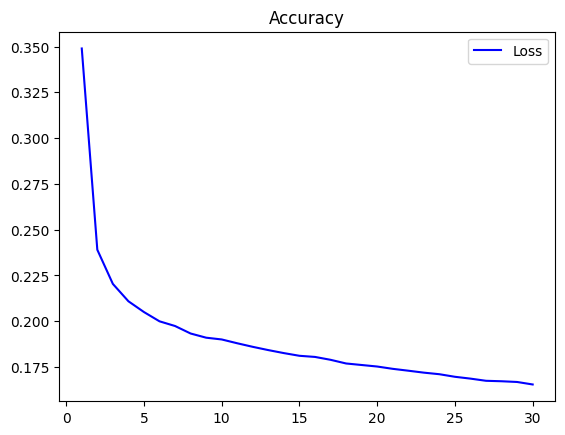

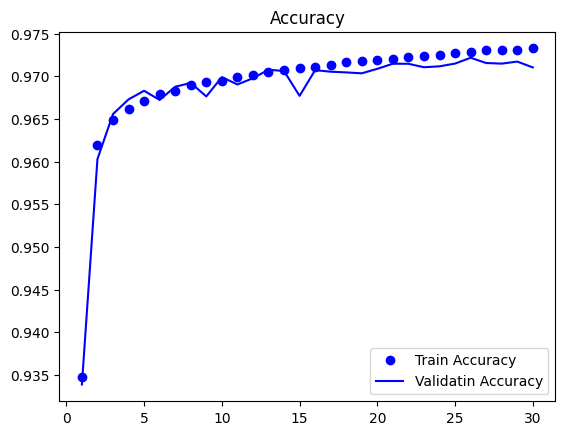

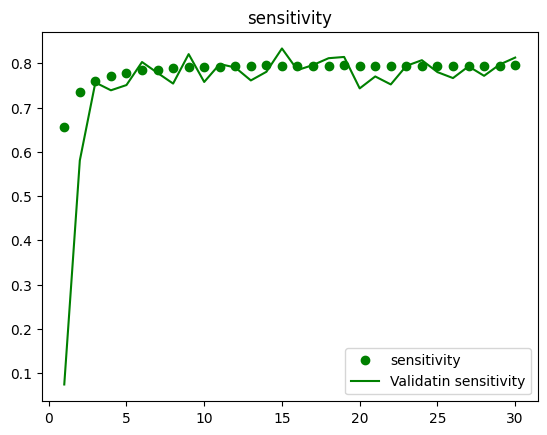

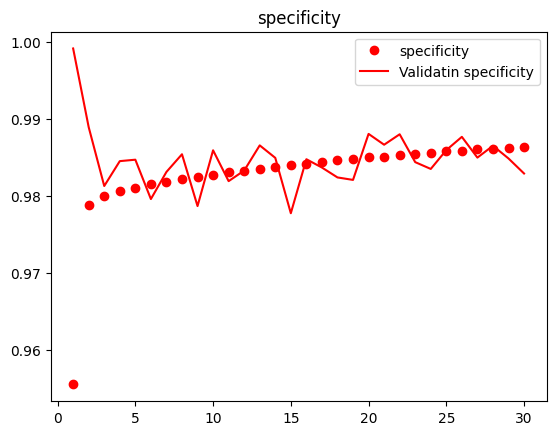

<Figure size 640x480 with 0 Axes>

In [2]:
check_result.plot_history(HISTORY_PATH)

In [4]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}

test_preproc = preprocess.build_augmentation_for_general(is_train=False)
test_generator = data_generator.FullSizedDataGenerator(
    TEST_SOURCE, 
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)
# Load the model with custom_objects parameter
MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_fG.tf/8--0.2729-0.6962-0.9774-0.7466-0.9725.pb'
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

metrics.print_evaluation(model, test_generator)

2024-01-30 15:25:58.145474: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 15:25:58.180441: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-30 15:25:58.180649: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

77/77 [==============================] - 20s 221ms/step - loss: 0.2851 - sensitivity: 0.7454 - specificity: 0.9695 - accuracy: 0.9551
Loss: 0.28510138392448425
Sensitivity: 0.7454267740249634
Specificity: 0.9694634079933167
Accuracy: 0.9550935626029968


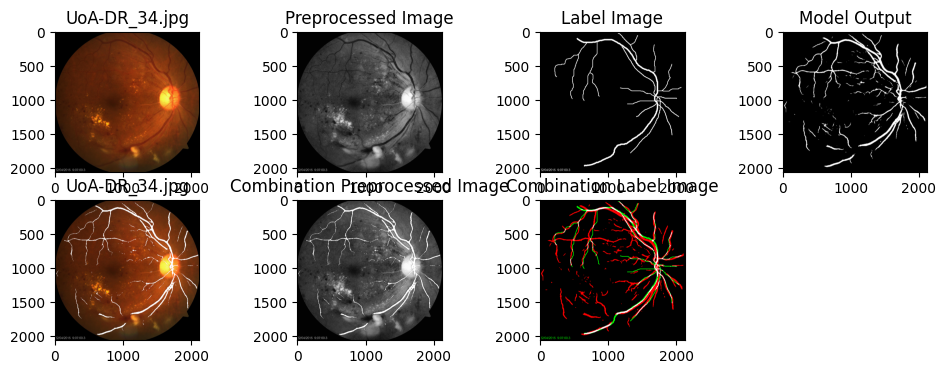

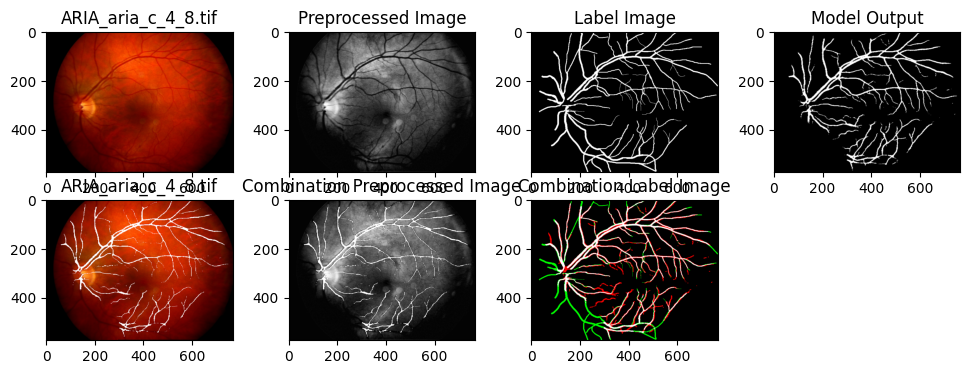

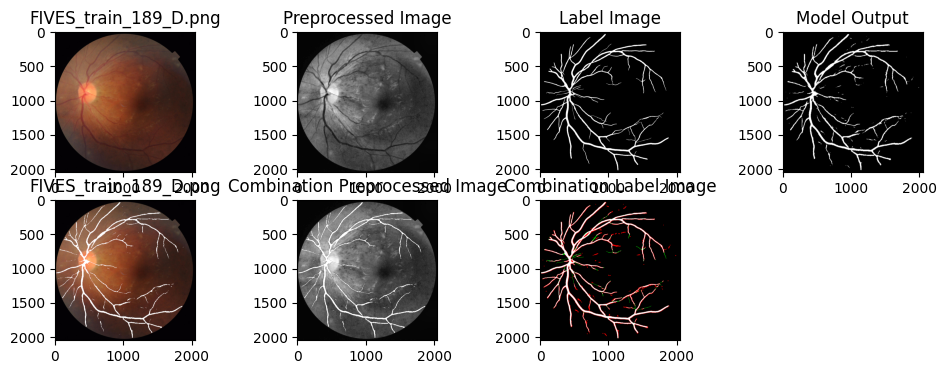

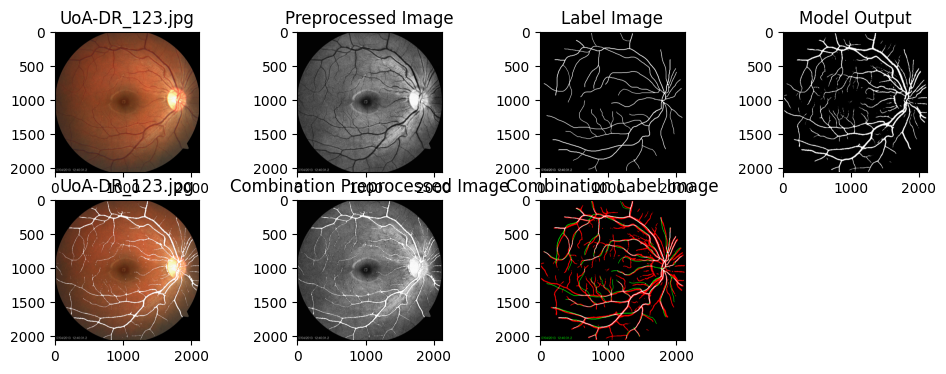

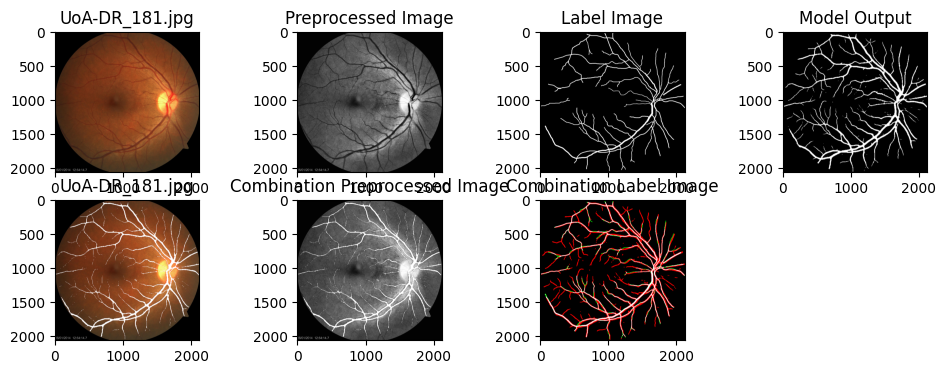

...

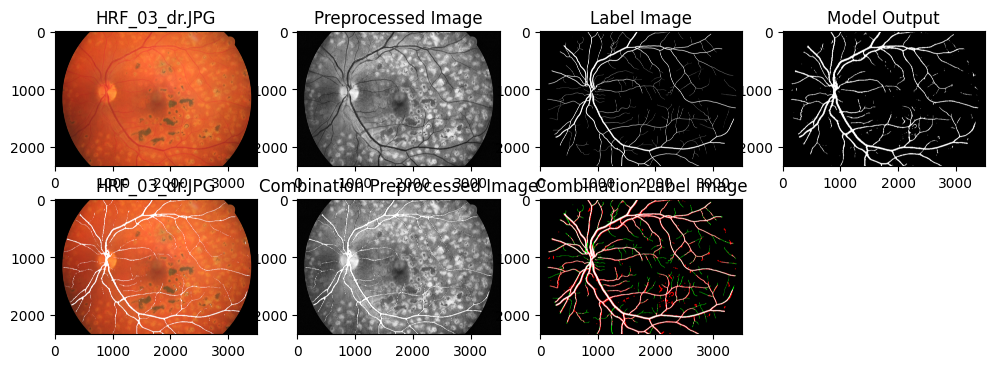

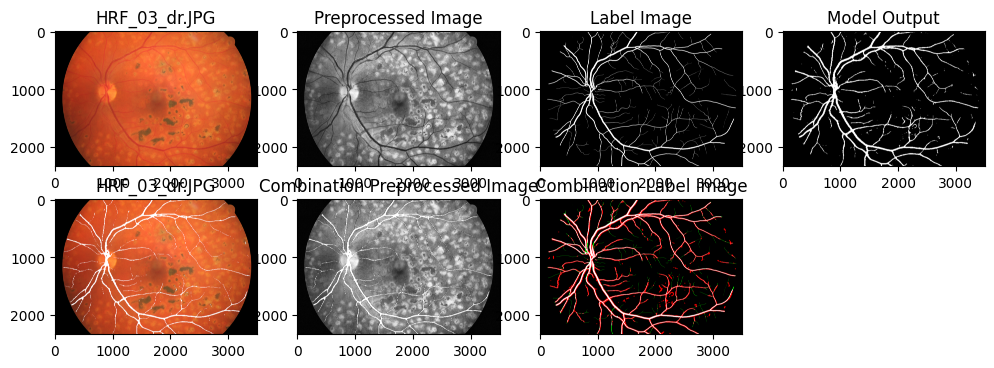

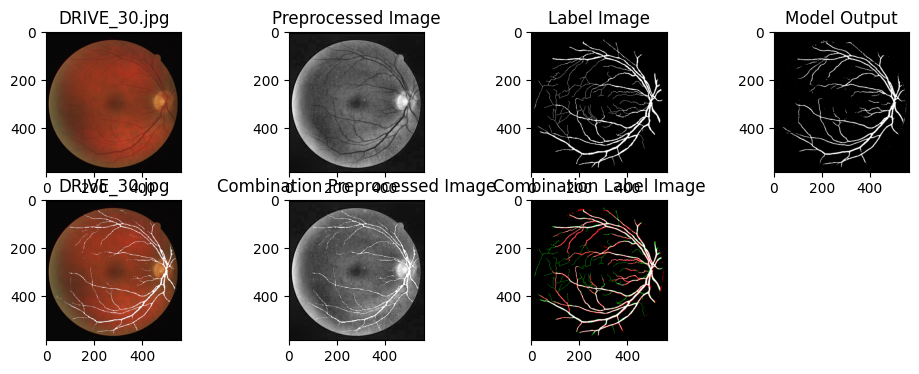

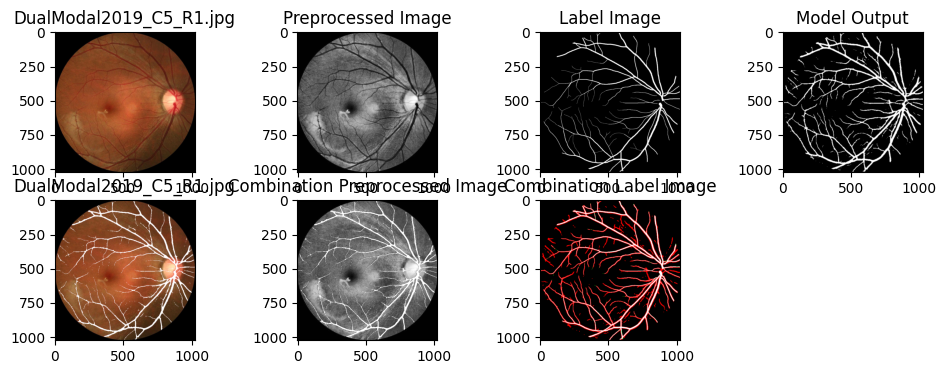

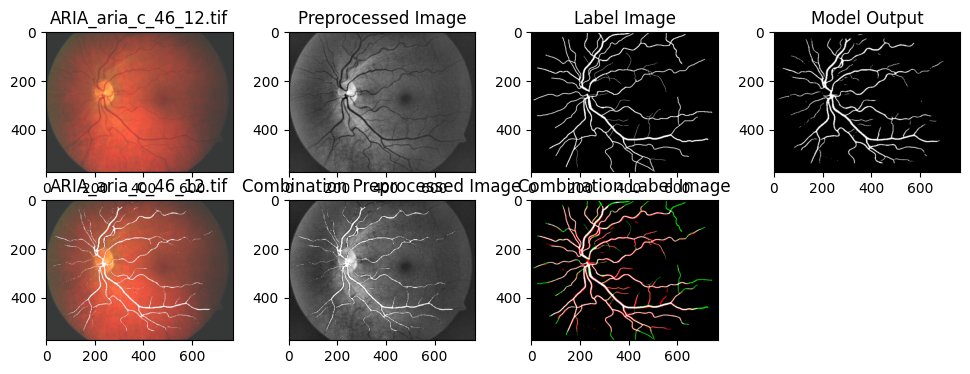

In [5]:
# Plot model result
num_images_to_select = 50
check_result.visualize_FG_result(model, num_images_to_select, TEST_SOURCE, INPUT_SHAPE, test_preproc)